In [1]:
%load_ext autoreload
%autoreload 2

%config InlineBackend.figure_format = 'retina'

In [2]:
import scanpy as sc 
import sys 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sys.path.append('../../src')
import warnings
warnings.filterwarnings('ignore')

from spaceoracle.prophets import Prophet

In [3]:
adata = sc.read_h5ad('/Users/koush/Desktop/training_data/mLND3-1_v4.h5ad')
adata

AnnData object with n_obs × n_vars = 15836 × 3069
    obs: 'cluster', 'rctd_cluster', 'cell_type', 'cell_type_int'
    var: 'n_counts'
    obsm: 'X_spatial', 'rctd_results', 'spatial'
    layers: 'imputed_count', 'normalized_count', 'raw_count'

In [4]:

pythia = Prophet(
    adata=adata,
    models_dir='/Volumes/SSD/mLDN3-1_v4',
    annot='rctd_celltypes',
    annot_labels='rctd_cluster'
)

In [5]:
pythia.queue

OracleQueue with 0 remaining genes

In [6]:
pythia.compute_betas(subsample=100)

100%|██████████| 100/100 [00:02<00:00, 37.06it/s]


In [7]:
from spaceoracle.plotting.cartography import xy_from_adata
xy = xy_from_adata(adata)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


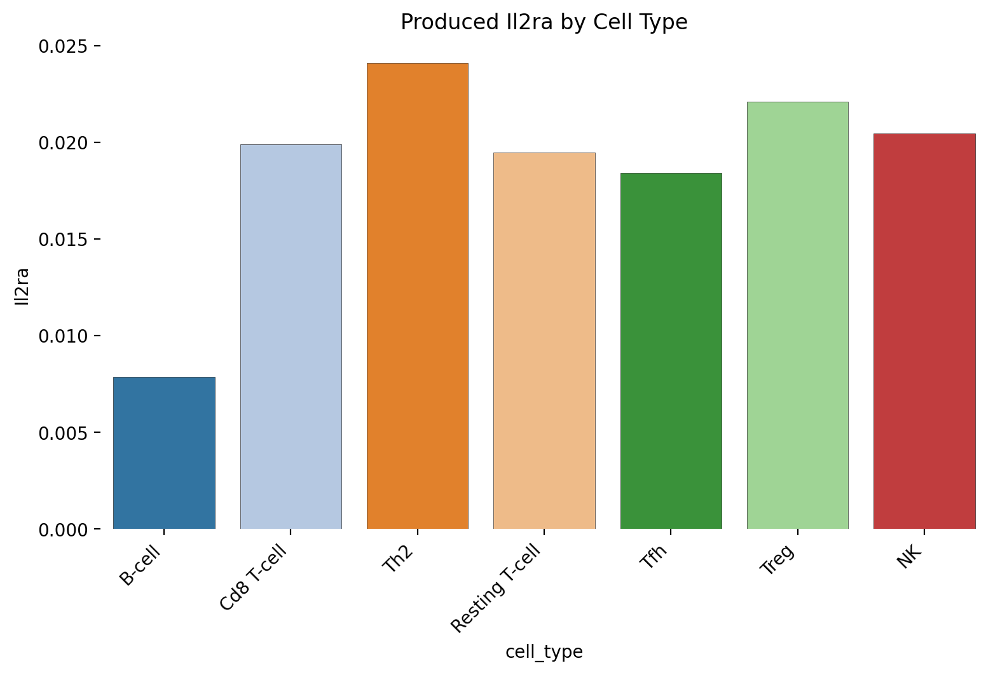

In [8]:
plt.rcParams['figure.figsize'] = (9, 5)
plt.rcParams['figure.dpi'] = 100

goi = 'Il2ra'

sns.barplot(
    data=pythia.adata.to_df(layer='imputed_count').join(xy).join(
        pythia.adata.obs['cell_type']).groupby(
            'cell_type')[goi].mean().reset_index(),
    x='cell_type',
    y=goi,
    linewidth=0.2,
    edgecolor='black',
    palette='tab20'
)
plt.xticks(rotation=45, ha='right')
plt.title(f'Produced {goi} by Cell Type')
plt.box(False)
plt.show()

In [9]:
# cells = list(
#     pythia.adata.obs.reset_index()[
#         pythia.adata.obs.reset_index()['cell_type'].isin(
#             ['T_follicular_helper']
#         )].index)

# cell_idx = xy[
#     (xy.x > 2000) & (xy.y < 1500)].join(
#     pythia.adata.obs['cell_type']).query('cell_type=="B_germinal_center"').index

# cells = pythia.adata.obs.reset_index()[pythia.adata.obs.reset_index()['NAME'].isin(cell_idx)].index.tolist()

cells = pythia.adata.obs.reset_index().index.tolist()
len(cells), len(adata.obs)

(15836, 15836)

In [ ]:
%%time

pythia.perturb_batch(
    target_genes=['Il6st', 'Pax5'], 
    n_propagation=3, 
    gene_expr=0, 
    save_to='/tmp'
)

Pax5 -> 0:  33%|███▎      | 1/3 [00:09<00:19,  9.74s/it]

In [46]:
adata.to_df(layer='imputed_count')

,9930111J21Rik1,9930111J21Rik2,Aaas,Aamdc,Aatk,Abca7,Abcc1,Abcc12,Abcg1,Abcg3,...,Zkscan6,Zkscan8,Zmat1,Zmym1,Zmym5,Znrd1,Zscan30,Zswim5,Zwilch,Zzef1
AAAAAAAGCCAACA,0.000109,0.006903,0.026378,0.007570,0.000666,0.004563,0.004065,0.000000,0.016216,0.004129,...,0.001790,0.000668,0.000999,0.001088,0.012696,0.025628,0.000847,0.000710,0.018486,0.008985
AAAAAACGGTAGAT,0.000167,0.020370,0.009756,0.016156,0.000152,0.012065,0.004282,0.000002,0.070067,0.017179,...,0.003007,0.001536,0.001035,0.001478,0.021345,0.029257,0.000923,0.000003,0.002458,0.012380
AAAAAATCCGGCGA,0.000724,0.010390,0.009857,0.007208,0.000290,0.007739,0.006757,0.000000,0.079702,0.006973,...,0.003868,0.000691,0.001670,0.001336,0.020177,0.051137,0.002390,0.000503,0.004699,0.012026
AAAAACCGTCAGAC,0.000298,0.011280,0.013152,0.007168,0.000046,0.008088,0.003810,0.000034,0.021184,0.005537,...,0.004119,0.000402,0.003076,0.000659,0.032078,0.051472,0.001018,0.000062,0.002475,0.011830
AAAAACGCTCCGAC,0.000239,0.013659,0.013412,0.009601,0.000026,0.008313,0.007498,0.000014,0.024155,0.007642,...,0.004106,0.000920,0.001596,0.002346,0.021389,0.034699,0.002649,0.000052,0.002745,0.014887
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTTTTGTACGATT,0.000336,0.014100,0.015120,0.007861,0.000107,0.007097,0.015869,0.000048,0.022305,0.013519,...,0.003127,0.000426,0.001386,0.000971,0.015184,0.042358,0.001513,0.000010,0.002840,0.016590
TTTTTTTATGGTAC,0.000322,0.016342,0.018856,0.008269,0.000193,0.017682,0.005447,0.000083,0.068393,0.014533,...,0.002022,0.000209,0.001706,0.003637,0.019033,0.026268,0.000305,0.000072,0.001636,0.011180
TTTTTTTGTCGCCT,0.000353,0.009822,0.024809,0.009126,0.000164,0.010543,0.008228,0.000000,0.033219,0.007455,...,0.003320,0.000789,0.001953,0.001123,0.024238,0.029553,0.001084,0.000958,0.007070,0.009809
TTTTTTTTATTATA,0.000938,0.011609,0.016138,0.007747,0.000060,0.009519,0.012974,0.000041,0.025326,0.007671,...,0.004396,0.001446,0.002241,0.001331,0.016003,0.040222,0.000840,0.000010,0.003210,0.021507


In [43]:
pd.read_parquet('/tmp/Il6st_3n_0x.parquet')

,9930111J21Rik1,9930111J21Rik2,Aaas,Aamdc,Aatk,Abca7,Abcc1,Abcc12,Abcg1,Abcg3,...,Zkscan6,Zkscan8,Zmat1,Zmym1,Zmym5,Znrd1,Zscan30,Zswim5,Zwilch,Zzef1
AAAAAAAGCCAACA,0.000109,0.005050,0.024276,0.007473,0.000666,0.004008,0.005686,0.000000,0.010223,0.003630,...,0.001790,0.000668,0.000999,0.001088,0.012696,0.025628,0.000847,0.000710,0.018486,0.008985
AAAAAACGGTAGAT,0.000167,0.015864,0.007513,0.015549,0.000152,0.007685,0.007040,0.000002,0.058516,0.016997,...,0.003007,0.001536,0.001035,0.001478,0.021345,0.029257,0.000923,0.000003,0.002458,0.012380
AAAAAATCCGGCGA,0.000724,0.010336,0.009939,0.006269,0.000290,0.007715,0.006747,0.000000,0.078342,0.009956,...,0.003868,0.000691,0.001670,0.001336,0.020177,0.051137,0.002390,0.000503,0.004699,0.012026
AAAAACCGTCAGAC,0.000298,0.007146,0.009745,0.006291,0.000046,0.007454,0.005241,0.000034,0.015439,0.006311,...,0.004119,0.000402,0.003076,0.000659,0.032078,0.051472,0.001018,0.000062,0.002475,0.011830
AAAAACGCTCCGAC,0.000239,0.010911,0.011220,0.009127,0.000026,0.006774,0.008506,0.000014,0.019754,0.008437,...,0.004106,0.000920,0.001596,0.002346,0.021389,0.034699,0.002649,0.000052,0.002745,0.014887
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTTTTGTACGATT,0.000336,0.012799,0.013730,0.007835,0.000107,0.005173,0.018959,0.000048,0.018679,0.012757,...,0.003127,0.000426,0.001386,0.000971,0.015184,0.042358,0.001513,0.000010,0.002840,0.016590
TTTTTTTATGGTAC,0.000322,0.011852,0.016473,0.008160,0.000193,0.011945,0.011386,0.000083,0.062370,0.013500,...,0.002022,0.000209,0.001706,0.003637,0.019033,0.026268,0.000305,0.000072,0.001636,0.011180
TTTTTTTGTCGCCT,0.000353,0.010458,0.024819,0.008929,0.000164,0.010609,0.008228,0.000000,0.032632,0.007218,...,0.003320,0.000789,0.001953,0.001123,0.024238,0.029553,0.001084,0.000958,0.007070,0.009809
TTTTTTTTATTATA,0.000938,0.007191,0.013476,0.007269,0.000060,0.007810,0.014405,0.000041,0.020194,0.008103,...,0.004396,0.001446,0.002241,0.001331,0.016003,0.040222,0.000840,0.000010,0.003210,0.021507


In [25]:
pythia.adata.to_df(layer='delta_X').mean(0).sort_values()

Actb      -0.188718
C3        -0.073960
Cd3d      -0.063063
Anp32e    -0.049513
Ccl22     -0.045117
             ...   
Arpc5l     0.033532
Cd79b      0.037872
Ccr7       0.038067
Arl6ip1    0.040227
Ccl5       0.060051
Length: 3500, dtype: float64

In [20]:
del pythia.adata.layers['delta_X']

In [21]:
pythia.adata.layers

Layers with keys: imputed_count, normalized_count, raw_count, simulated_count

In [22]:
pythia.perturb(
    target='Pax5', 
    n_propagation=3, 
    gene_expr=0, 
    # cells=cells,
    use_optimized=False
)

Running simulation 3/3: 100%|██████████| 12998/12998 [07:20<00:00, 29.52it/s]


In [23]:
pythia.adata.to_df(layer='delta_X').mean(0).sort_values()

Cd74     -0.330612
Actb     -0.161208
Calm1    -0.092156
Pax5     -0.076646
Cd22     -0.062121
            ...   
Cd3d      0.052174
Bcl11b    0.053464
Ccr7      0.056221
Ccl22     0.070345
Ccl5      0.131279
Length: 3500, dtype: float64

In [13]:
pythia.adata.layers

Layers with keys: imputed_count, normalized_count, raw_count, simulated_count, delta_X

<Axes: xlabel='x', ylabel='y'>

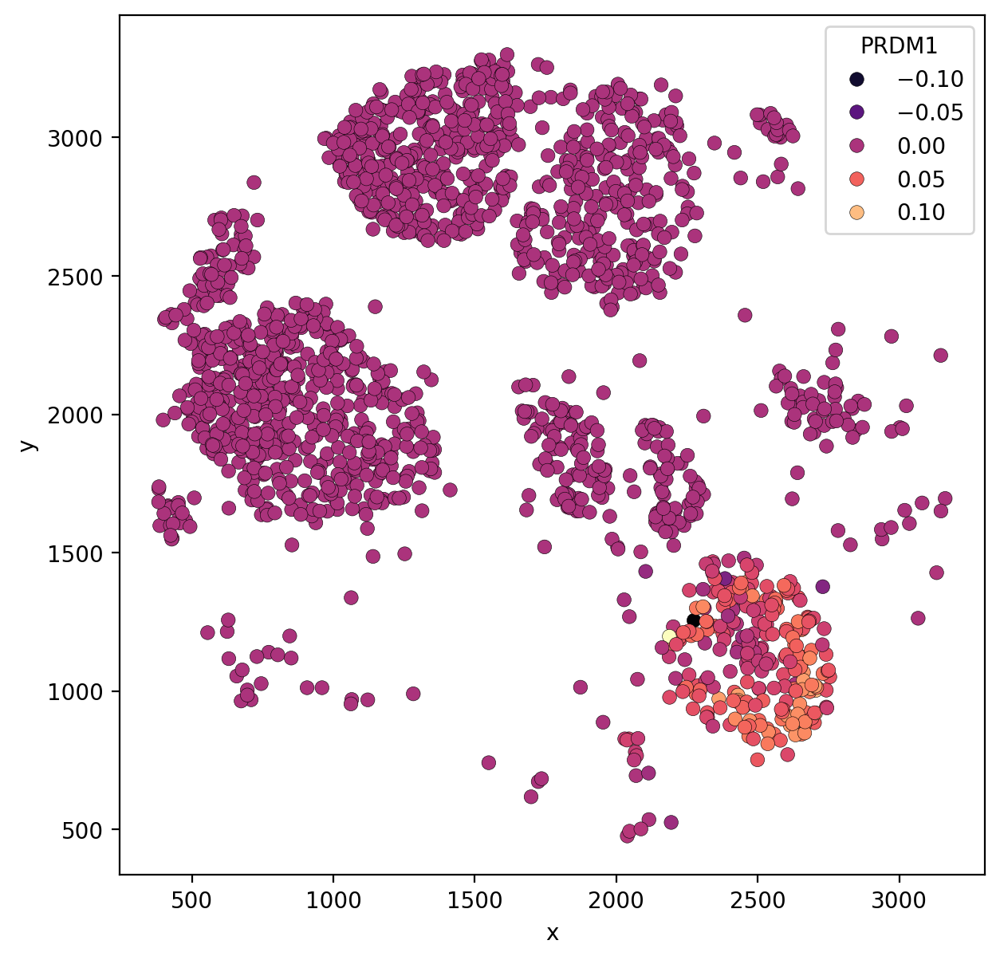

In [23]:
plt.rcParams['figure.figsize'] = (7, 7)
plt.rcParams['figure.dpi'] = 100
sns.scatterplot(
    x='x', y='y', 
    data=pythia.adata.to_df(layer='delta_X').join(xy).join(
        pythia.adata.obs['cell_type']).query('cell_type=="B_germinal_center"'), 
    hue='PRDM1', 
    palette='magma',
    linewidth=0.2,
    edgecolor='black',
    s=40,
)

In [24]:
import numpy as np
from sklearn.neighbors import NearestNeighbors
from velocyto.estimation import colDeltaCor, colDeltaCorpartial

def estimate_transition_probabilities(adata, delta_X, embedding=None, n_neighbors=200, 
random_neighbors=False, annot=None, T=0.05, n_jobs=1):

    n_cells, n_genes = adata.shape
    delta_X = np.array(delta_X)
    gene_mtx = adata.layers['imputed_count']
    
    if n_neighbors is None:

        P = np.ones((n_cells, n_cells))

        corr = colDeltaCor(
            np.ascontiguousarray(gene_mtx.T), 
            np.ascontiguousarray(delta_X.T), 
            threads=n_jobs
            )
    
    else:

        P = np.zeros((n_cells, n_cells))

        n_neighbors = min(n_cells, n_neighbors)
        
        if random_neighbors == 'even':

            cts = np.unique(adata.obs[annot])
            ct_dict = {ct: np.where(adata.obs[annot] == ct)[0] for ct in cts}
            cells_per_ct = round(n_neighbors / len(cts))

            indices = []

            for i in range(n_cells):
                i_indices = []

                for ct, ct_cells in ct_dict.items():

                    sample = np.random.choice(ct_cells[ct_cells != i], size=cells_per_ct, replace=False)
                    i_indices.extend(sample)

                i_indices = np.array(i_indices)
                P[i, i_indices] = 1
                indices.append(i_indices)

            indices = np.array(indices)

        elif random_neighbors:
            
            indices = []
            cells = np.arange(n_cells)
            for i in range(n_cells):
                i_indices = np.random.choice(np.delete(cells, i), size=n_neighbors, replace=False)
                P[i, i_indices] = 1
                indices.append(i_indices)
            
            indices = np.array(indices)

        else: 

            nn = NearestNeighbors(n_neighbors=n_neighbors, n_jobs=n_jobs)
            nn.fit(embedding)
            _, indices = nn.kneighbors(embedding)

            rows = np.repeat(np.arange(n_cells), n_neighbors)
            cols = indices.flatten()
            P[rows, cols] = 1

        corr = colDeltaCorpartial(
            np.ascontiguousarray(gene_mtx.T), 
            np.ascontiguousarray(delta_X.T), 
            indices, threads=n_jobs
            )

    np.fill_diagonal(P, 0)
    corr = np.nan_to_num(corr, nan=1)
    P *= np.exp(corr / T)   
    P /= P.sum(1)[:, None]

    return corr, P

In [25]:
import cellrank as cr

In [26]:
delta_df = pythia.adata.to_df(layer='delta_X').copy()
# delta_df = pythia.adata.to_df(layer='imputed_count') - pythia.propagations[0]

<Axes: xlabel='cell_type'>

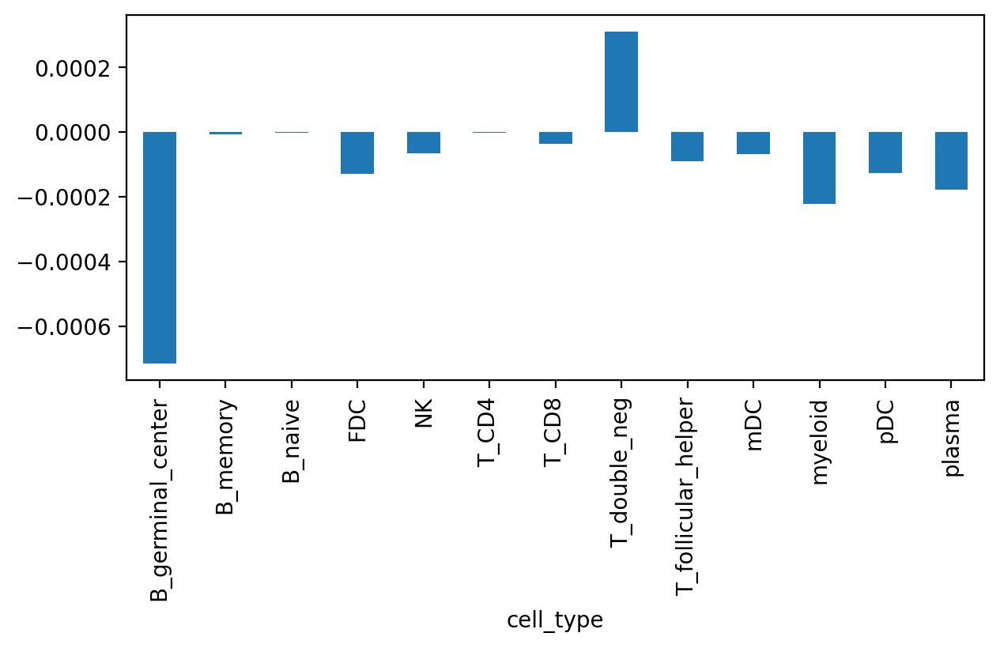

In [27]:
plt.rcParams['figure.figsize'] = (7, 3)
delta_df.join(pythia.adata.obs['cell_type']).groupby('cell_type').mean().mean(1).plot.bar()

In [28]:
import matplotlib.pyplot as plt

In [29]:
sc.pp.neighbors(pythia.adata)
sc.tl.umap(pythia.adata)

/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 3544 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


In [30]:
# delta_df = pythia.adata.to_df(layer='imputed_count').copy()
# delta_df[goi] = 0
# delta_df = delta_df - pythia.adata.to_df(layer='imputed_count').copy()

In [31]:
adata_shuff = pythia.adata.copy()
adata_shuff.layers['imputed_count'] = adata_shuff.to_df(layer='imputed_count').sample(frac=1).values

In [32]:
corr_rand, P_rand  = estimate_transition_probabilities(
    adata_shuff, 
    delta_df.values,
    n_neighbors=None,
    random_neighbors=True,
    embedding=None, 

)

adata_shuff.obsp['ko_shift'] = P_rand.copy()

corr, P = estimate_transition_probabilities(
    pythia.adata, 
    delta_df.values,
    random_neighbors=False,
    n_neighbors=300,
    embedding=pythia.adata.obsm['X_umap'], 
)

pythia.adata.obsp['ko_shift'] = P.copy()

In [33]:
ck = cr.kernels.ConnectivityKernel(pythia.adata, conn_key='ko_shift')
ck_rand = cr.kernels.ConnectivityKernel(adata_shuff, conn_key='ko_shift')
ck.compute_transition_matrix(density_normalize=True)
ck_rand.compute_transition_matrix(density_normalize=True)

ConnectivityKernel[n=5778, dnorm=True, key='ko_shift']

In [55]:
delta_df2 = delta_df.copy()

In [76]:
delta_df2['abs_delta'] = delta_df2.abs().mean(1)

In [77]:
delta_df2 = delta_df2.iloc[list(set(pythia.adata.obs.reset_index().index.tolist()) - set(cells))]

<Axes: xlabel='x', ylabel='y'>

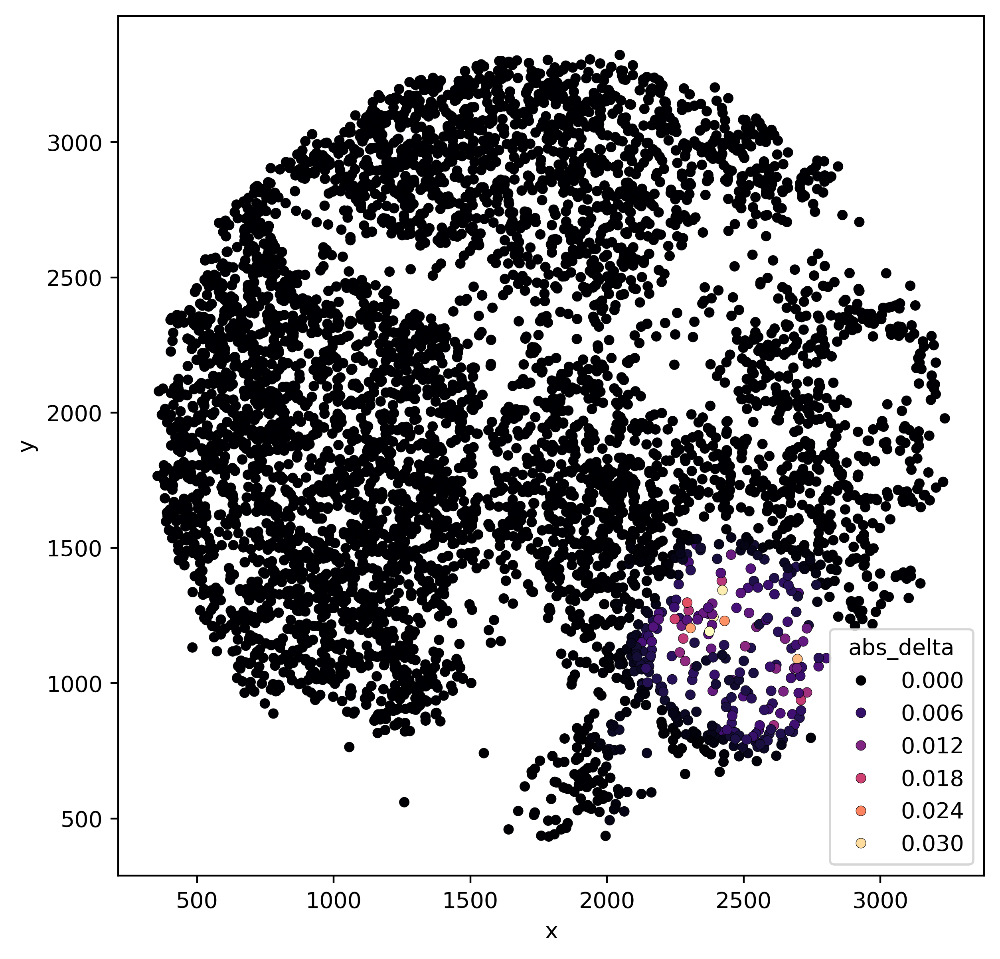

In [80]:
sns.scatterplot(
    x='x', y='y', 
    data=delta_df2.join(pythia.adata.obs['cell_type']).join(xy), 
    hue='abs_delta', 
    palette='magma',
    linewidth=0.2,
    edgecolor='black',
    s=20,
)


Renamed 'spatial' to convention 'X_spatial' (adata.obsm).
Renamed 'spatial' to convention 'X_spatial' (adata.obsm).


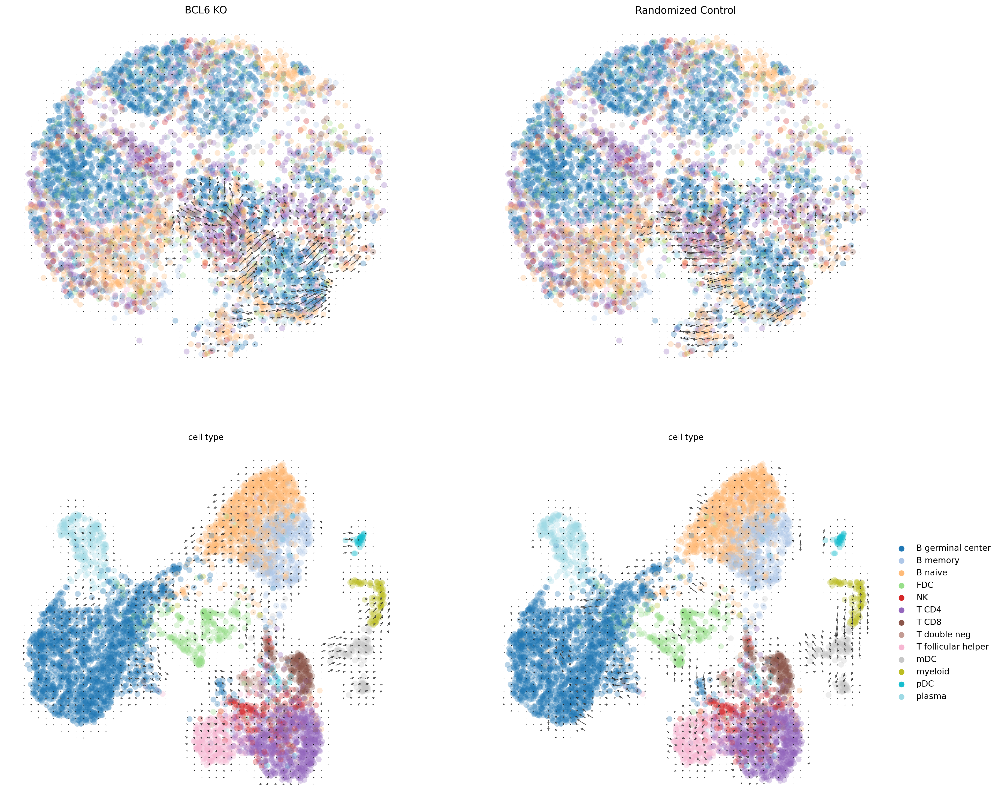

In [34]:
f, ax = plt.subplots(2, 2, figsize=(19, 8.5*2), dpi=120)
ax = ax.flatten()

projection_params_basis = {
    'basis': 'spatial',
    'color': 'cell_type', 
    'legend_loc': 'right',
    'recompute': True,
    'stream': False,
    'scale': 1.5,
    'alpha': 0.3,
    'size': 200,
    'show': False,
    'palette': 'tab20',
    'smooth': 0.9,
    'n_neighbors': 100
}

projection_params_umap = projection_params_basis.copy()
projection_params_umap.update({'basis': 'umap'})

scatter_params = {
    'x': 'x',
    'y': 'y',
    'data': xy.join(pythia.adata.obs['cell_type']).iloc[cells],
    'color': 'red', 
    's': 50,
    'legend': False,
    'linewidth': 0.4,
    'alpha': 0.5,
    'edgecolor': 'black',
    'marker': 'X'
}

# Plot KO projection
ck.plot_projection(**projection_params_basis, ax=ax[0])
ck.plot_projection(**projection_params_umap, ax=ax[2])


# Plot randomized control
ck_rand.plot_projection(**projection_params_basis, ax=ax[1]) 
ck_rand.plot_projection(**projection_params_umap, ax=ax[3]) 


# sns.scatterplot(**scatter_params, ax=ax[0])
# sns.scatterplot(**scatter_params, ax=ax[1])

# Add titles
ax[0].set_title(f'{goi} KO')
ax[1].set_title('Randomized Control')
ax[0].get_legend().remove()
ax[1].get_legend().remove()
ax[2].get_legend().remove()

plt.show()

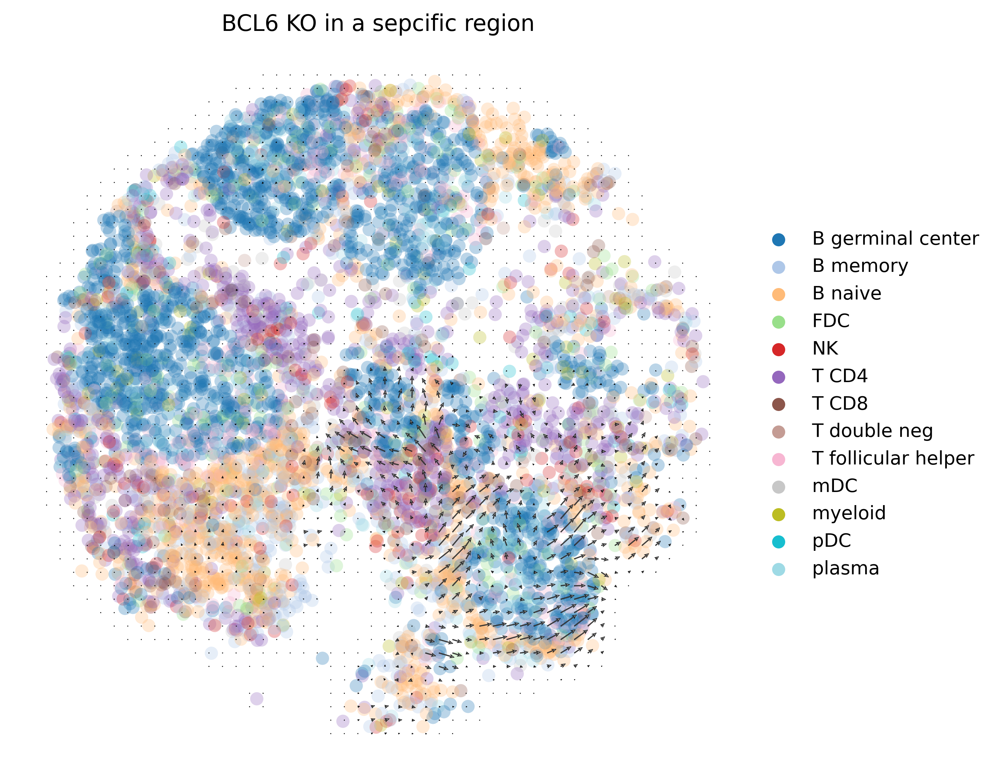

In [92]:
plt.rcParams['figure.figsize'] = (7, 7)
plt.rcParams['figure.dpi'] = 200
scatter_params['s'] = 10

projection_params_basis = {
    'basis': 'spatial',
    'color': 'cell_type', 
    'legend_loc': 'right',
    'recompute': True,
    'stream': False,
    'scale': 1.5,
    'alpha': 0.3,
    'size': 200,
    'show': False,
    'palette': 'tab20',
    'smooth': 1,
    'n_neighbors': 200
}

ck.plot_projection(**projection_params_basis)
# sns.scatterplot(**scatter_params)
plt.title(f'{goi} KO in a sepcific region')
plt.show()

In [229]:
pd.DataFrame(
    P, index=pythia.adata.obs.cell_type, 
    columns=pythia.adata.obs.cell_type).iloc[0].to_frame().reset_index().query(
        'cell_type == "T_CD4"').sort_values(by='T_CD4', ascending=False)

,cell_type,T_CD4
489,T_CD4,0.108859
1714,T_CD4,0.103350
4106,T_CD4,0.101567
4307,T_CD4,0.060230
4284,T_CD4,0.058505
...,...,...
2184,T_CD4,0.000000
2187,T_CD4,0.000000
2191,T_CD4,0.000000
2192,T_CD4,0.000000


/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


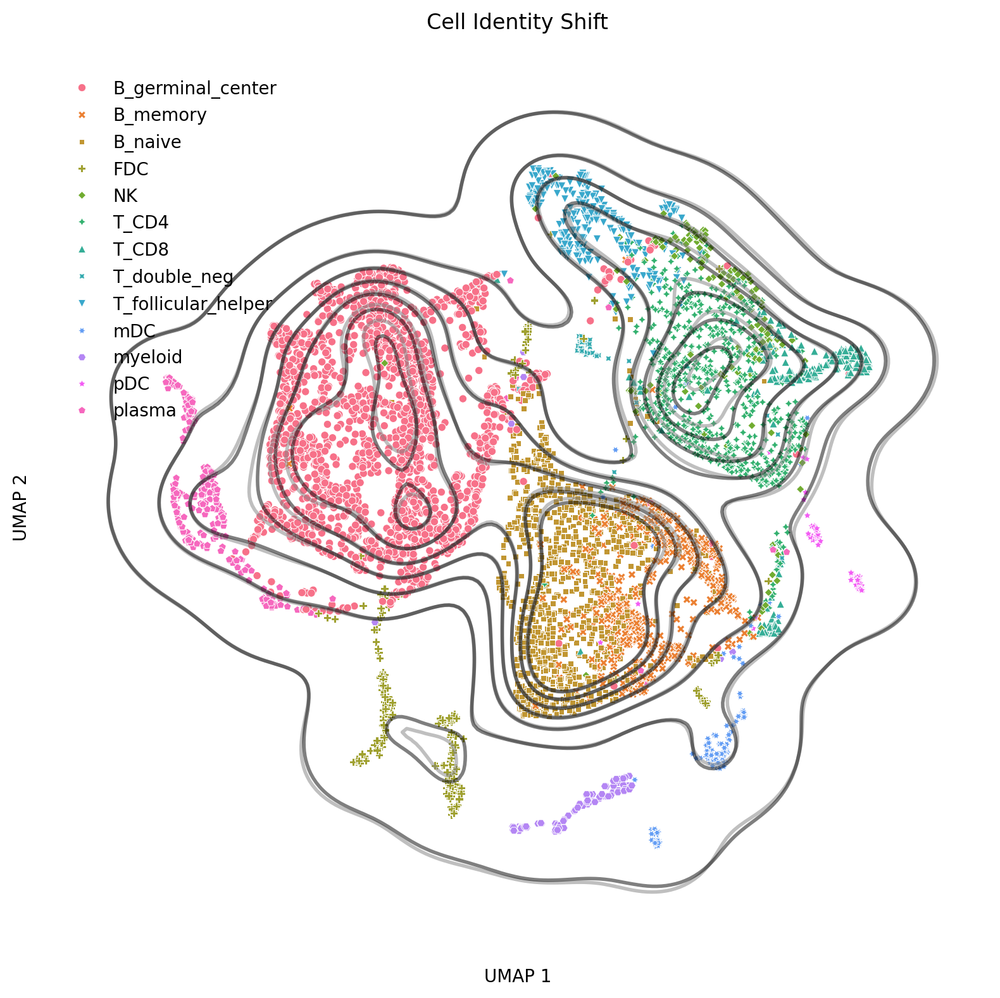

In [213]:
pythia.plot_contour_shift()

In [96]:
cells

[60,
 196,
 220,
 239,
 257,
 522,
 594,
 633,
 692,
 741,
 902,
 1441,
 1658,
 1670,
 2047,
 2148,
 2207,
 2575,
 2596,
 2956,
 2990,
 3022,
 3118,
 3140,
 3530,
 3570,
 3740,
 3819,
 4046,
 4220,
 4245,
 4495,
 4631,
 4643,
 4882,
 4889,
 4969,
 5140,
 5173,
 5187,
 5189,
 5273,
 5303,
 5309,
 5365,
 5413,
 5545,
 5580,
 5690]

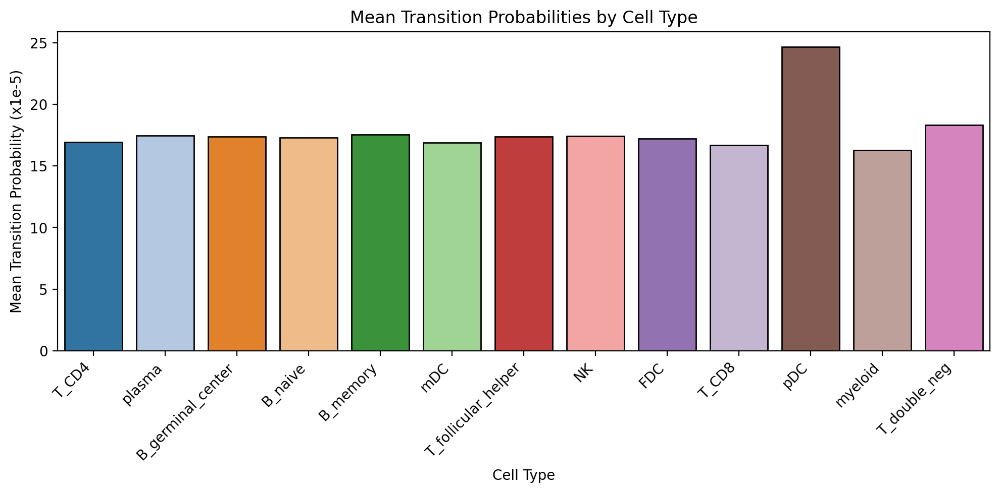

In [61]:
# Create dictionary to store values
ct_means = {}
for ct in pythia.adata.obs['cell_type'].unique():
    idx = pythia.adata[pythia.adata.obs['cell_type']==ct].obs_names
    ct_means[ct] = pd.DataFrame(
        ck_rand.transition_matrix.toarray(), 
        index=adata_shuff.obs_names, 
        columns=adata_shuff.obs_names).loc[idx, idx].mean().mean() * 1e5

# Convert to DataFrame for seaborn
plot_df = pd.DataFrame({'Cell Type': ct_means.keys(), 'Mean Transition Probability': ct_means.values()})

# Create bar plot using seaborn
plt.figure(figsize=(10,5))
sns.barplot(
    data=plot_df, x='Cell Type', 
    y='Mean Transition Probability', 
    linewidth=1, 
    edgecolor='black', 
    palette='tab20'
)
plt.xticks(rotation=45, ha='right')
plt.ylabel('Mean Transition Probability (x1e-5)')
plt.title('Mean Transition Probabilities by Cell Type')
plt.tight_layout()
plt.show()

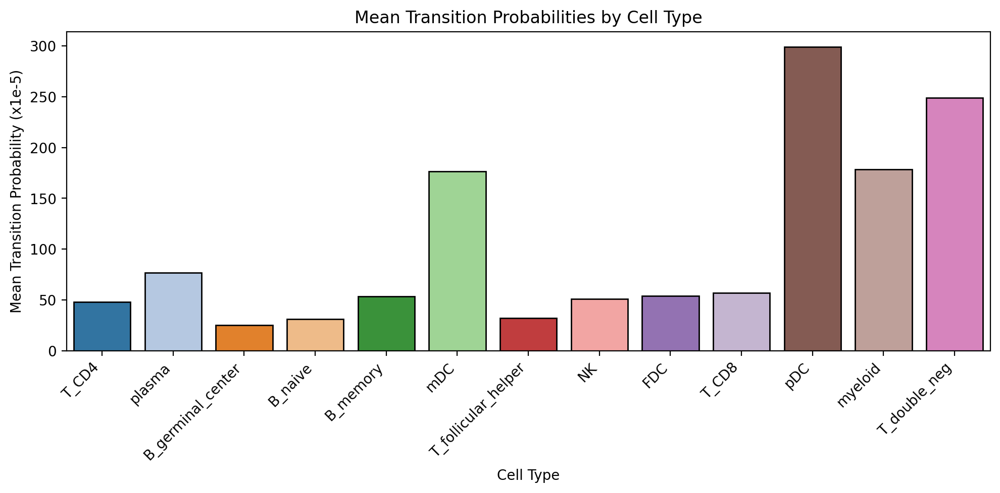

In [49]:
# Create dictionary to store values
ct_means = {}
for ct in pythia.adata.obs['cell_type'].unique():
    idx = pythia.adata[pythia.adata.obs['cell_type']==ct].obs_names
    ct_means[ct] = pd.DataFrame(
        ck.transition_matrix.toarray(), 
        index=pythia.adata.obs_names, 
        columns=pythia.adata.obs_names).loc[idx, idx].mean().mean() * 1e5

# Convert to DataFrame for seaborn
plot_df = pd.DataFrame({'Cell Type': ct_means.keys(), 'Mean Transition Probability': ct_means.values()})

# Create bar plot using seaborn
plt.figure(figsize=(10,5))
sns.barplot(
    data=plot_df, x='Cell Type', 
    y='Mean Transition Probability', 
    linewidth=1, 
    edgecolor='black', 
    palette='tab20'
)
plt.xticks(rotation=45, ha='right')
plt.ylabel('Mean Transition Probability (x1e-5)')
plt.title('Mean Transition Probabilities by Cell Type')
plt.tight_layout()
plt.show()